**<h1> Manipulating Images </h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, both as arrays and PIL image objects. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab:


In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


We will be using these imported functions in the lab:


In [2]:
import matplotlib.pyplot as plt #Thư viện vẽ biểu đồ
from PIL import Image #Thư viện pillow, dùng để mở và xử lý ảnh
import numpy as np #Thư viện Numpy, xử lý mảng số, ma trận, ảnh dạng arr

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. 


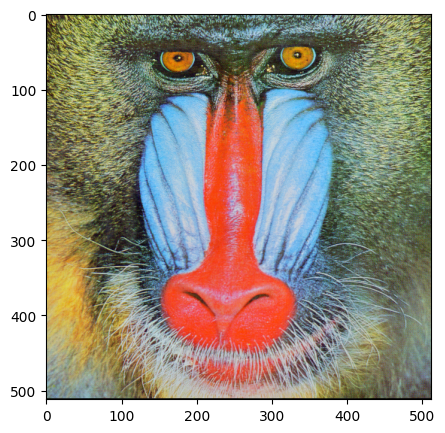

In [3]:
baboon = np.array(Image.open('baboon(512x512).png')) #Mở file ảnh bằng thư viện PIL và chuyển định dạng ảnh sang mảng Numpy
plt.figure(figsize=(5,5)) #Tạo khung mới có kích thước 5x5
plt.imshow(baboon ) #Hiển thị ảnh từ mảng Numpy
plt.show() #Hiển thị ảnh ra màn hình

If we do not apply the method `copy()`, the two variables would point to the same location in memory:


In [4]:
A = baboon #Gán biến A bằng với biến baboon cả hai cùng trỏ tới cùng 1 mảng Numpy trong bộ nhớ

We use the  `id`  function to find a variable's memory address; we see the objects in the memory space which the variables `A` and `baboon` point to are the same.


In [5]:
id(A) == id(baboon) #So sánh địa chỉ bộ nhớ của 2 biến A và baboon

True

However, if we apply method `copy()`, their memory addresses are different.


In [6]:
B = baboon.copy() #Tạo một bản sao của mảng baboon
id(B)==id(baboon) #So sánh địa chỉ bộ nhớ của 2 biến B và baboon

False

There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `baboon`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `baboon` and `B` points to different objects, the values in `B` will not be affected. 


In [7]:
baboon[:,:,] = 0 #Gán toàn bộ pixel của ảnh baboon về 0

We can compare the variables <code>baboon</code> and array <code>A</code>:


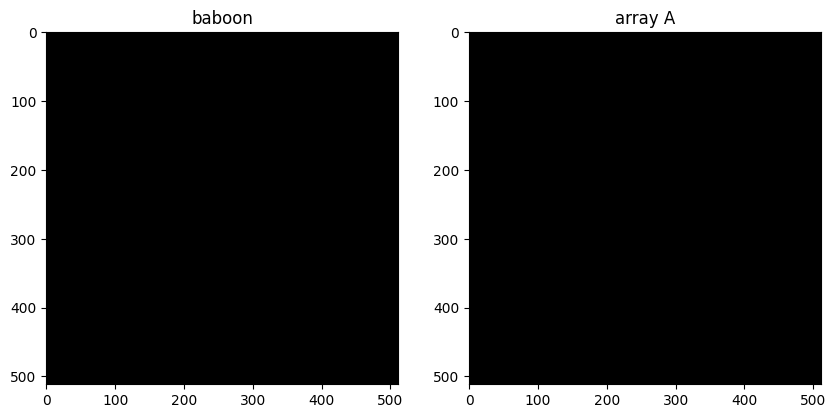

In [8]:
plt.figure(figsize=(10,10)) #Tạo khung ảnh có kích thước 10x10 
plt.subplot(121) #Chia figure thành 1 hàng, 2 cột(Chọn ô bên trái là ô thứ nhất)
plt.imshow(baboon) #Hiển thị ảnh baboon
plt.title("baboon") #Đặt tiêu đề là baboon
plt.subplot(122) #Chọn ô bên phải là ô thứ 2  
plt.imshow(A) #Hiển thị ảnh A
plt.title("array A") #Đặt tiêu đề là array A
plt.show() #Hiển thị ra màn hình

We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory. 

We can also compare <code>baboon</code> and array <code>B</code>:


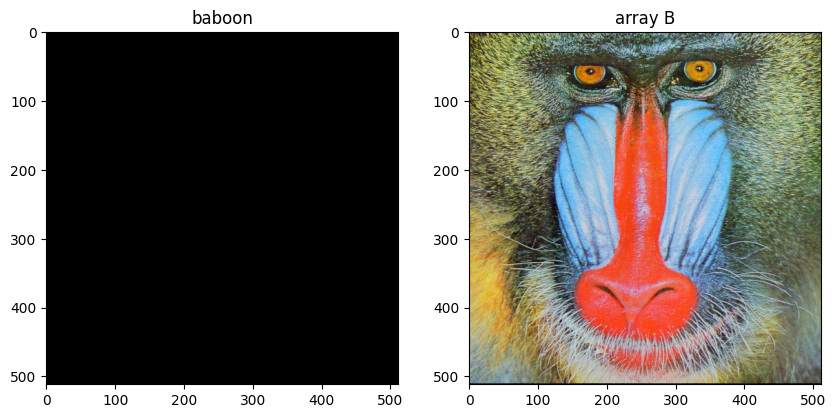

In [ ]:
plt.figure(figsize=(10,10))#Tạo khung hình mới có kích thước 10x10
plt.subplot(121)#Chia figure thành 1 hàng, 2 cột(Chọn ô bên trái là ô thứ nhất)
plt.imshow(baboon)#Hiển thị ảnh baboon
plt.title("baboon")#Đặt tiêu đề là baboon
plt.subplot(122)#Chọn ô bên phải là ô thứ 2 
plt.imshow(B)#Hiển thị ảnh B
plt.title("array B")#Đặt tiêu đề là array B
plt.show()#Hiển thị ra màn hình


If a PIL function does not return a new image, the same principle applies. We will go over some examples later on. 


## Flipping Images 


Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


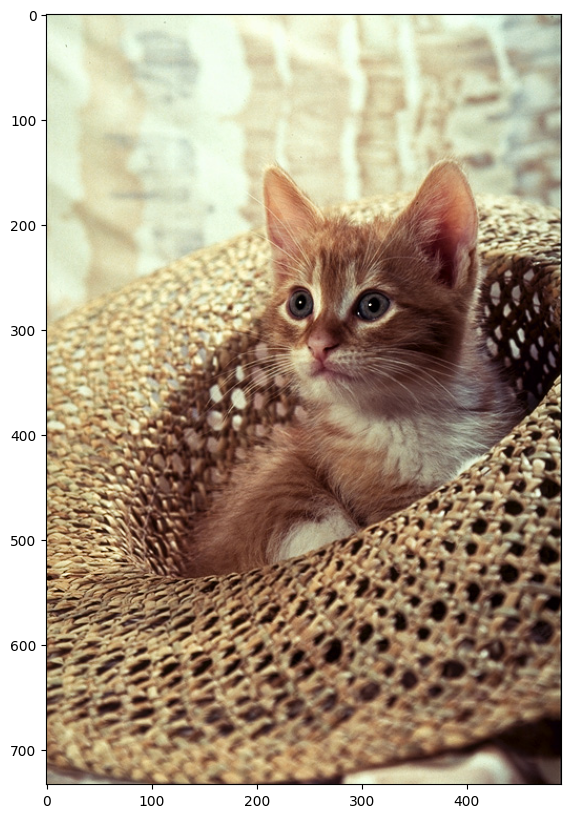

In [ ]:
image = Image.open("cat(490x733).png")#Mở file ảnh bằnng thư viện PIL 
plt.figure(figsize=(10,10))# Tạo khung hình kích thước 10x10
plt.imshow(image)# Hiển thị ảnh ra màn hình
plt.show()# Hiển thị ảnh

We can cast it to an array and find its shape:


In [ ]:
array = np.array(image)
# Chuyển ảnh từ đối tượng PIL.Image sang mảng NumPy
# array là ảnh màu dạng ma trận 3 chiều (H × W × C)
width, height, C = array.shape# Lấy kích thước của ảnh từ shape
print('width, height, C', width, height, C)# Hiển thị ra kích thước ảnh và số kênh màu

width, height, C 733 490 3


Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype <code>np.uint8</code>.


In [ ]:
array_flip = np.zeros((width, height, C), dtype=np.uint8)#tạo một ảnh màu mới dưới dạng mảng NumPy với kích thước (H × W × C), tất cả pixel được khởi tạo bằng 0 và có kiểu dữ liệu uint8.

We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, `array_flip` will become the flipped image. 


In [ ]:
for i,row in enumerate(array):
    array_flip[width - 1 - i, :, :] = row
#lật ảnh theo chiều dọc bằng cách gán các hàng pixel từ trên xuống sang vị trí đối xứng từ dưới lên trong ảnh mới.

<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [ ]:
from PIL import ImageOps#ImageOps là 1 module của thư viện PIL cung cấp các phép biến đổi ảnh cơ bản

The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


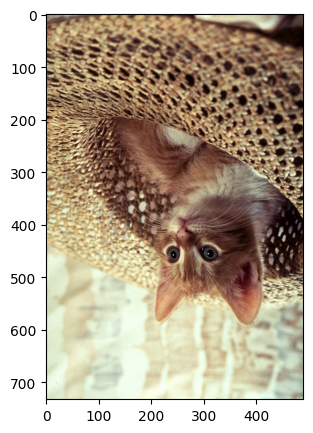

In [ ]:
im_flip = ImageOps.flip(image)# Lật ảnh theo chiều dọc (trên qua dưới)
plt.figure(figsize=(5,5))# Tạo khung hình kích thước 5x5
plt.imshow(im_flip)# Hiển thị ảnh đã được lật
plt.show()# Hiển thị ảnh ra màn hình

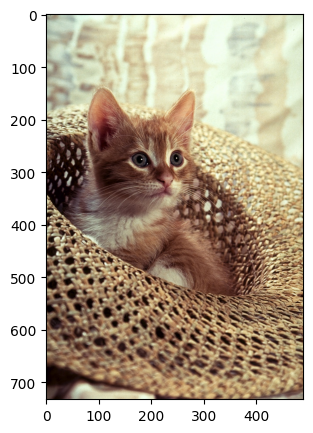

In [ ]:
im_mirror = ImageOps.mirror(image)# Lật ảnh theo chiều ngang (trái qua phải)
plt.figure(figsize=(5,5))# Tạo khung hình kích thước 5x5
plt.imshow(im_mirror)# Hiển thị ảnh đã được lật ngang
plt.show()# Hiển thị ảnh ra màn hình

We can use  the <code>transpose()</code> method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of `1`.


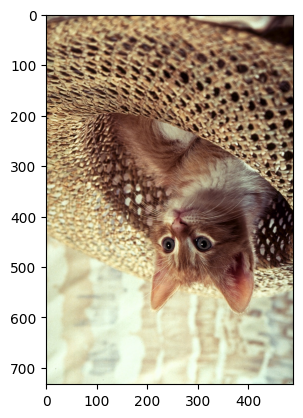

In [ ]:
im_flip = image.transpose(1)# Lật ảnh theo chiều ngang(trái qua phải)
plt.imshow(im_flip)# Hiển thị ảnh đã được lật ngang
plt.show()# Hiển thị ảnh ra màn hình

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [ ]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,#Lật ngang(trái qua phải)
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,#Lật dọc(trên xuống dưới)
        "ROTATE_90": Image.ROTATE_90,#Xoay 90 độ
        "ROTATE_180": Image.ROTATE_180,#Xoay 180 độ
        "ROTATE_270": Image.ROTATE_270,#Xoay 270 độ
        "TRANSPOSE": Image.TRANSPOSE, #Lật theo đường chéo chính
        "TRANSVERSE": Image.TRANSVERSE}#Lật theo đường chéo phụ

We see the values are integers.


In [ ]:
flip["FLIP_LEFT_RIGHT"]#hằng số của PIL dùng để lật ảnh theo chiều ngang (trái sang phải).

0

We can plot each of the outputs using the different  parameter values:


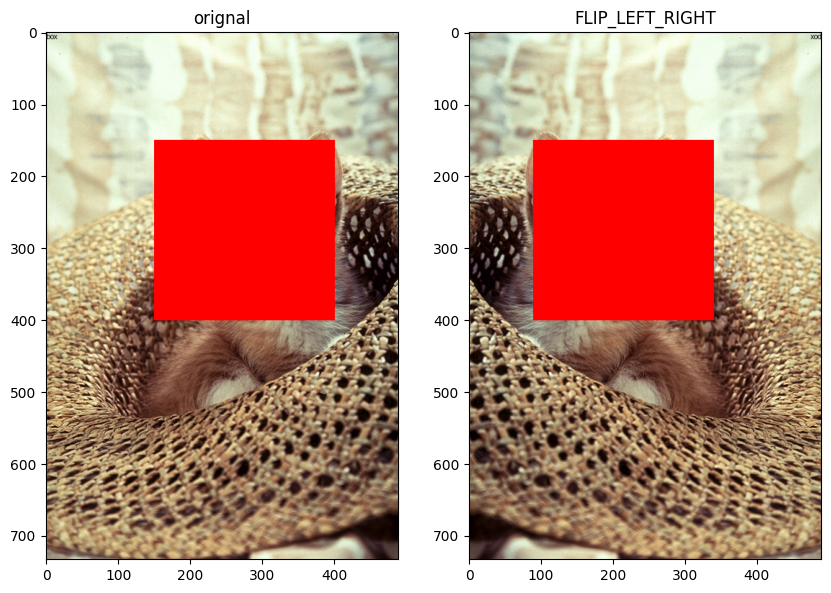

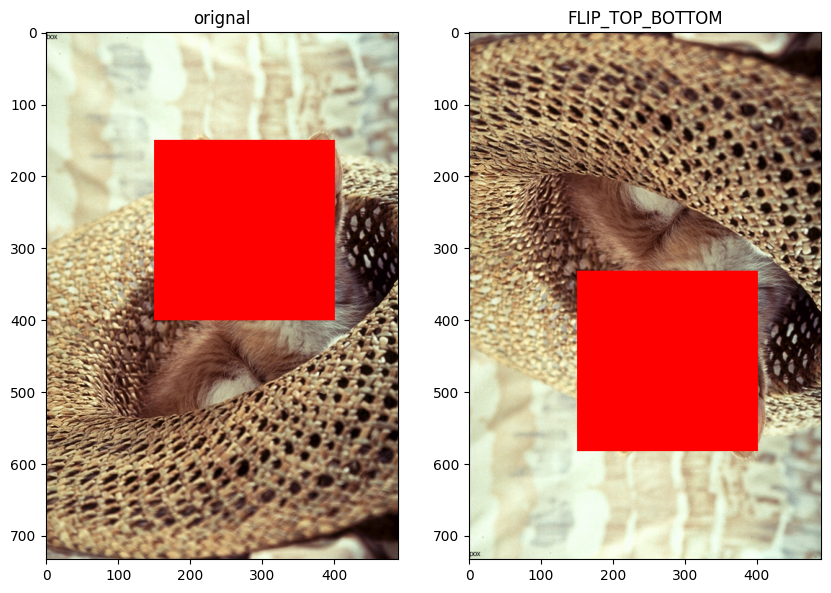

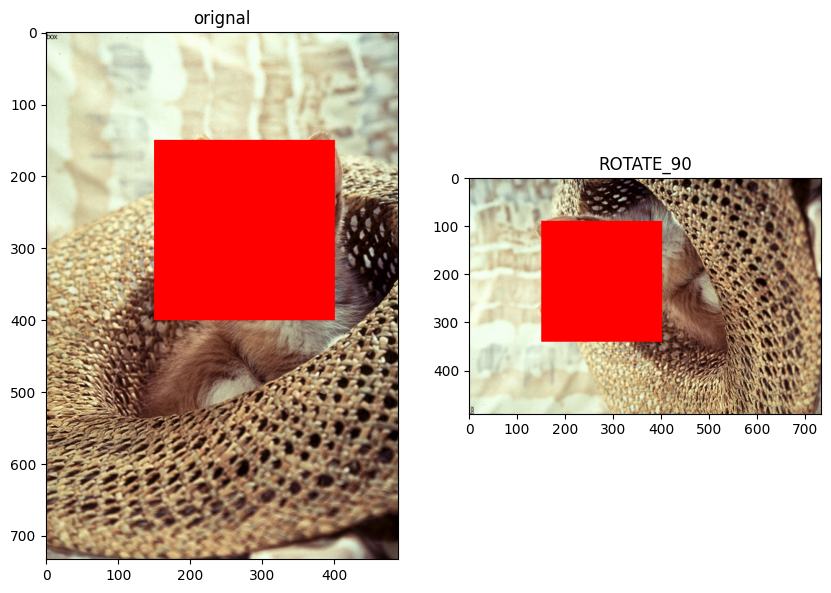

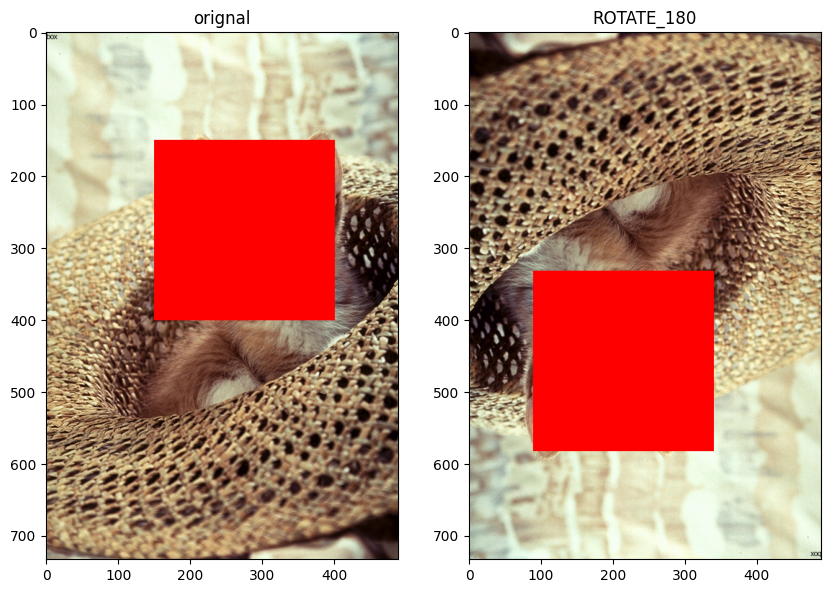

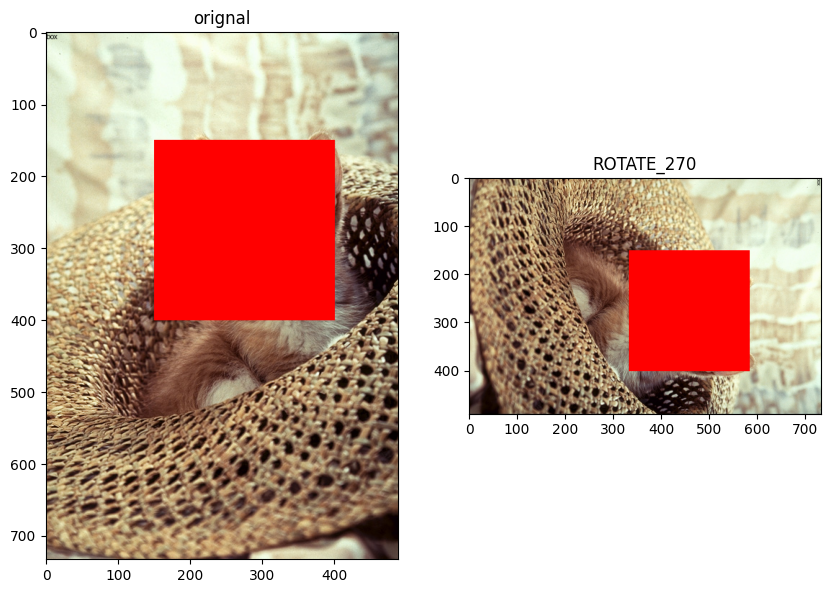

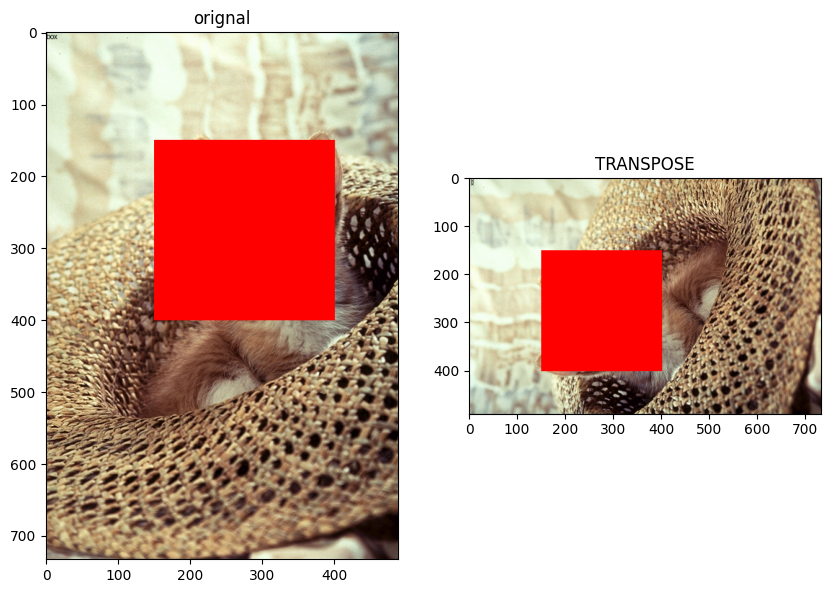

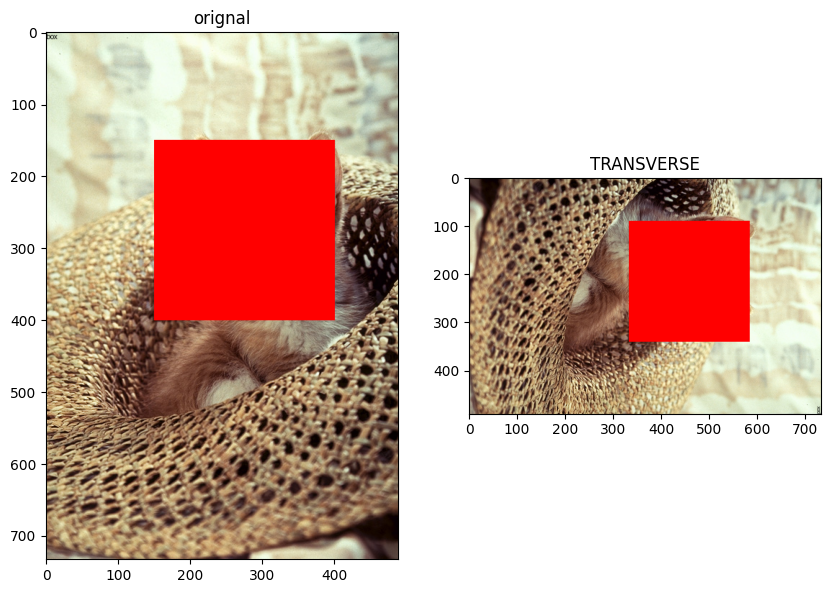

In [ ]:
for key, values in flip.items():
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(image.transpose(values))
    plt.title(key)
    plt.show()
#Đoạn code duyệt qua các phép biến đổi ảnh trong dictionary flip, hiển thị song song ảnh gốc và ảnh sau khi áp dụng từng phép biến đổi bằng hàm transpose() của thư viện PIL.

 ## Cropping an Image


Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing. 

Let start with a vertical crop: the variable `upper` is the index of the first row that we would like to include in the image, the variable `lower` is the index of the last row we would like to include. We then perform array slicing to obtain the new image. 


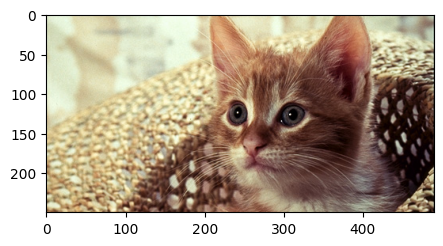

In [ ]:
#Đoạn code thực hiện phép cắt ảnh theo chiều dọc bằng cách sử dụng NumPy slicing, giữ nguyên chiều ngang và các kênh màu của ảnh.
upper = 150
lower = 400
crop_top = array[upper: lower,:,:]#Cắt ảnh bằng NumPy slicing 
plt.figure(figsize=(5,5))
plt.imshow(crop_top)
plt.show()

Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


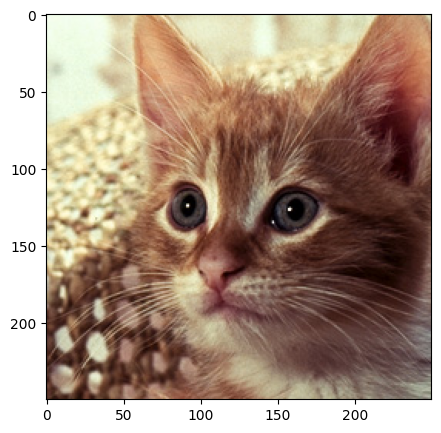

In [ ]:
#Đoạn code thực hiện phép cắt ảnh theo chiều ngang bằng NumPy slicing trên ảnh đã được cắt theo chiều dọc trước đó.
left = 150
right = 400
crop_horizontal = crop_top[: ,left:right,:]#Cắt ảnh bằng NumPy slicing trong đó ":", lấy toàn bộ hàng "left:right" cột từ trái sang phải, ":" lấy toàn bộ kênh màu
plt.figure(figsize=(5,5))
plt.imshow(crop_horizontal)
plt.show()

You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


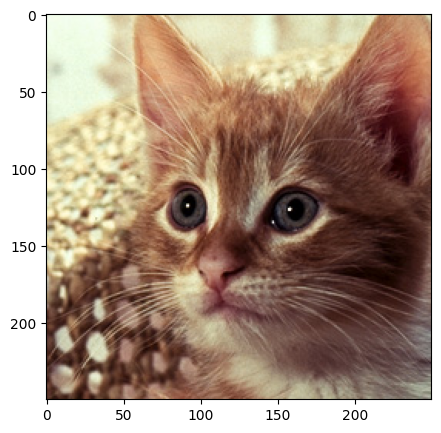

In [ ]:
#Đoạn code sử dụng hàm crop() của thư viện PIL để cắt ảnh theo vùng quan tâm (ROI) xác định bởi các tọa độ (left, upper, right, lower).
image = Image.open("cat(490x733).png")
crop_image = image.crop((left, upper, right, lower))
plt.figure(figsize=(5,5))
plt.imshow(crop_image)
plt.show()

We can also flip the new image:


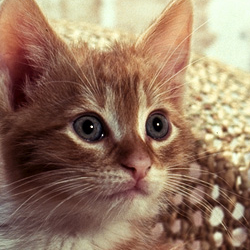

In [ ]:

crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)#Lật ảnh theo chiều ngang (trái sang phải)
crop_image # Hiển thị ảnh ra màn hình

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the green and blue channels in the original image we cropped to zero:


In [ ]:
array_sq = np.copy(array)#Tạo bản sao độc lập của ảnh gốc array
array_sq[upper:lower, left:right, 1:3] = 0 #Chỉ giữ màu đỏ

We can compare the results with the new image. 


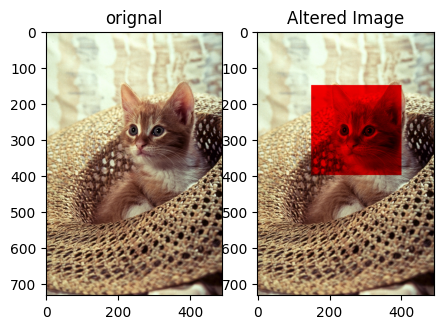

In [ ]:
#Đoạn code hiển thị song song ảnh gốc và ảnh đã được chỉnh sửa kênh màu trong vùng ROI nhằm so sánh sự khác biệt.
plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(array)
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(array_sq)
plt.title("Altered Image")
plt.show()

We can also use the `ImageDraw` module from `PIL` library, which provides simple 2D graphics for Image objects 


In [ ]:
from PIL import ImageDraw#ImageDraw là module của PIL dùng để vẽ trực tiếp lên ảnh

We will copy the image object:


In [ ]:
image_draw = image.copy()#Tạo một bản sao độc lập của ảnh image

The draw constructor creates an object that can be used to draw in the given image. The input <code>im</code> is the image we would like to draw in.



In [ ]:
image_fn = ImageDraw.Draw(im=image_draw) #Tạo đối tượng vẽ trên ảnh copy

Whatever method we apply to the object <code>image_fn</code>, will change the image object <code>image_draw</code>.


We can draw a rectangle using the <code>rectangle</code> function, two important parameters include: <code>xy</code> – the coordinates bounding box  and <code>fill</code> – Color of the rectangle.


In [ ]:
shape = [left, upper, right, lower]#Xác định tọa độ hình chữ nhật
image_fn.rectangle(xy=shape,fill="red")#Vẽ hcn lên ảnh và tô kín hình hcn bằng màu đỏ

We can plot the image.


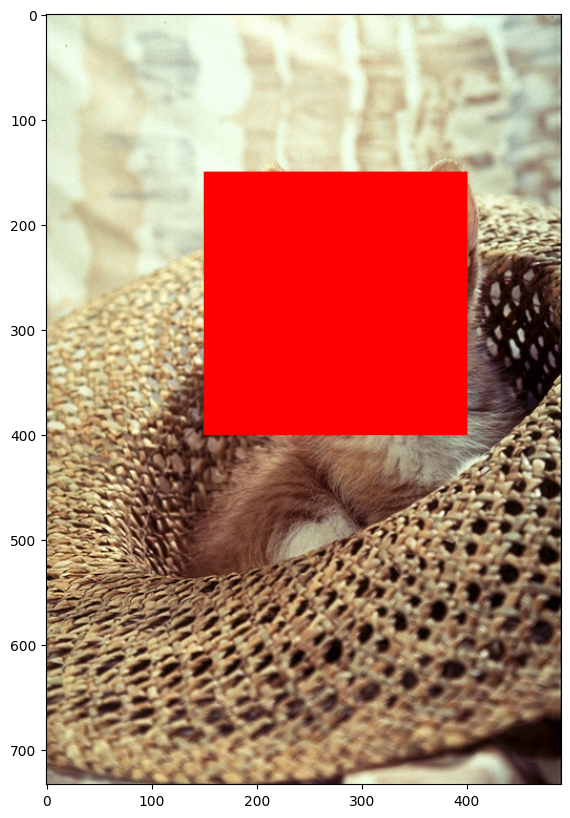

In [ ]:
#Hiển thị ảnh ra mà hình với khung hình 10x10
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

There are other shapes we can use. For example, we can also overlay text on an image: we use the ImageFont module to obtain  bitmap fonts.


In [ ]:
from PIL import ImageFont#ImageFont là module của PIL dùng để nạp và sử dụng font chữ khi vẽ text lên ảnh

We use the text method to place the text on the image. The parameters include `xy` (the top-left anchor coordinates of the text), the parameter `text` (the text to be drawn), and `fill` (the color to use for the text).


In [47]:
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))

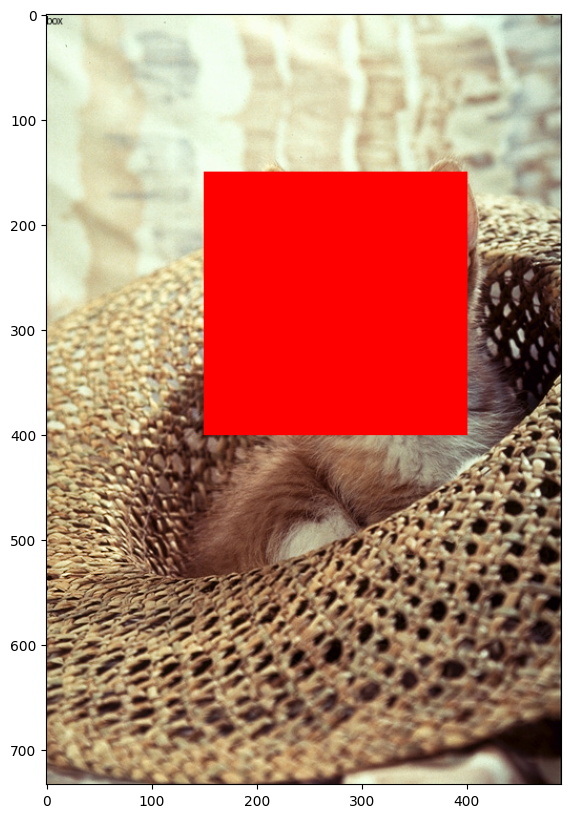

In [48]:
#Hiển thị ảnh ra màn hình với kích thước 10x10
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [ ]:
#Mở ảnh bằng PIL và chuyển ảnh từ PIL sang Numpy array
image_lenna = Image.open("lenna(512x512).png")
array_lenna = np.array(image_lenna)

We can reassign the pixel values as follows:


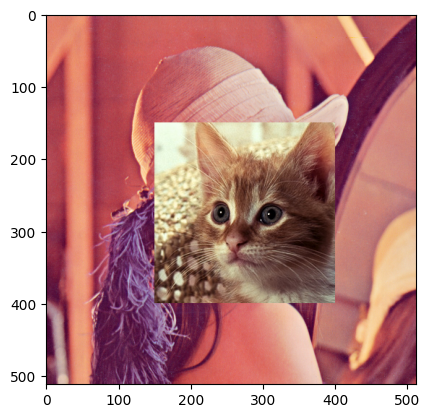

In [ ]:
#Thao tác ghép ảnh
array_lenna[upper:lower,left:right,:]=array[upper:lower,left:right,:]
plt.imshow(array_lenna)
plt.show()

In the same manner, the <code>paste()</code> method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:


In [ ]:
image_lenna.paste(crop_image, box=(left,upper))#Dán ảnh crop_image vào ảnh image_lenna

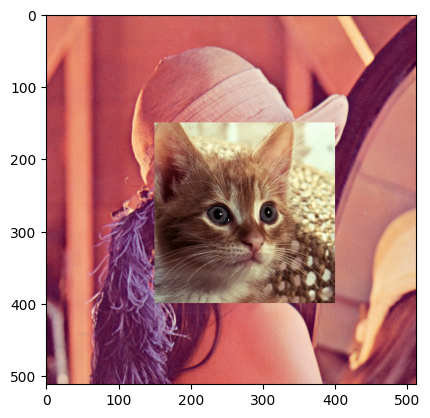

In [ ]:
#hiển thị ảnh ra màn hình
plt.imshow(image_lenna)
plt.show()

We can see the method `copy()` applies to some <code>PIL</code> objects. We create two image objects, we set `new_image` to the `image`, and we use the method `copy()` for the `copy_image` object.


In [ ]:
#Mở file ảnh và tạo bản sao
image = Image.open("cat(490x733).png")
new_image=image
copy_image=image.copy()

Like the array, we see that the same memory address relationship exists. For example, if we don't use the method `copy()`, the image object has the same memory address as the original PIL image object. 


In [ ]:
#Phép gán trực tiếp chỉ tạo thêm một biến tham chiếu đến cùng một đối tượng ảnh, do đó hai biến có cùng địa chỉ bộ nhớ.
id(image)==id(new_image)

True

If we use the method <code>copy()</code>, the address is different:


In [ ]:
#Phương thức copy() tạo ra một bản sao độc lập của ảnh, do đó hai biến trỏ đến hai vùng nhớ khác nhau.
id(image)==id(copy_image)

False

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same:


In [ ]:
#Đoạn code sử dụng lớp ImageDraw của thư viện PIL để vẽ văn bản và hình chữ nhật trực tiếp lên ảnh, trong đó các thao tác vẽ sẽ làm thay đổi ảnh gốc.
image_fn= ImageDraw.Draw(im=image)
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))
image_fn.rectangle(xy=shape,fill="red")

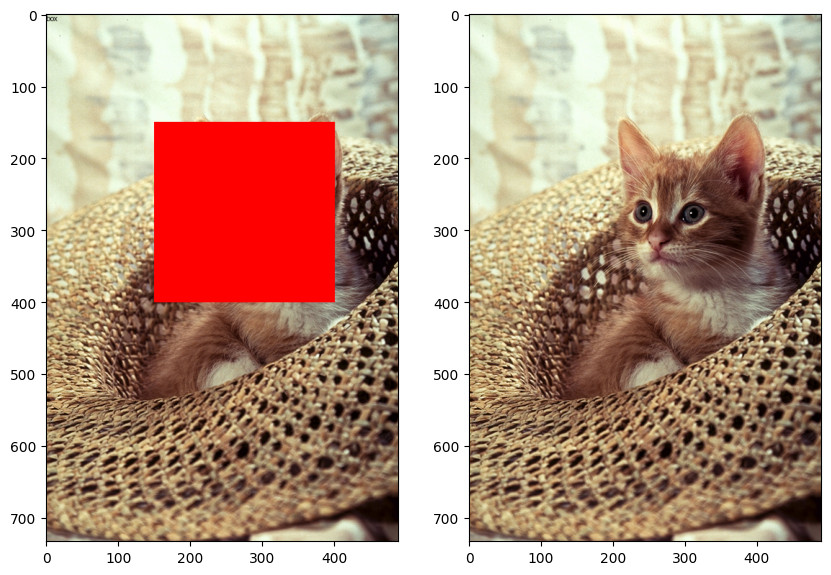

In [ ]:
#Hình ảnh bên trái là ảnh được chỉnh sửa trực tiếp do phép gán tham chiếu, trong khi hình ảnh bên phải là bản sao độc lập nên vẫn giữ nguyên nội dung ban đầu.
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(new_image)
plt.subplot(122)
plt.imshow(copy_image)
plt.show()

### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `im`, flip `im` and create an image called `im_flip`. Mirror `im` and create an image called `im_mirror`. Finally, plot both images.


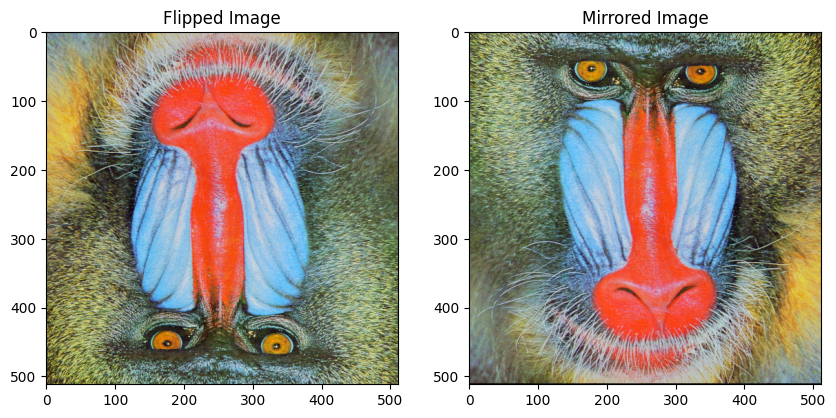

In [51]:
# write your script here
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
im = Image.open("baboon(512x512).png")#Mở file ảnh
im_flip = ImageOps.flip(im)#Lật ảnh theo chiều dọc(trên xuống dưới)
im_mirror = ImageOps.mirror(im)#Lật ảnh theo chiều ngang(trái sang phải)
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(im_flip)
plt.title("Flipped Image")
plt.subplot(1,2,2)
plt.imshow(im_mirror)
plt.title("Mirrored Image")
plt.show()

Double-click **here** for a hint.

<!-- The hint is below:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->
